# Capstone, Part 2: Problem Statement + EDA

## Problem Statement

Electric vehicles are the future. Consumers are interested in the greatly reduced fueling costs, minimal parts and maintenance, reduced carbon emissions, and exhilirating acceleration and power. The US big 3 automakers are chasing Tesla's dominance in the EV space:

Best of all, rebates and incentives save you money when you purchase or lease a new EV, helping make your transaction more affordable.
* On Jan 20, 2021, General Motors announced that they aim to sell only zero-emission cars and trucks by [2035](https://www.nytimes.com/2021/01/29/business/general-motors-electric-cars.html)
* Ford announced a \$29 billion investment in EVs and autonomous vehicles through 2025, with a statement that in the future, the majority of Ford vehicles will be electric, while traditional gasoline powertrains will be augmented with hybrid and plug-in hybrid [powertrains](https://www.caranddriver.com/news/a35432253/ford-ev-commitment-announced/)
* Stellantis – the product of a $52 billion merger between automakers Fiat Chrysler and Groupe PSA – plans to offer an array of all-electric or hybrid vehicles through [2025](https://www.cnbc.com/2021/01/19/from-jeep-to-maserati-stellantis-to-rollout-10-new-ev-models-in-2021.html)
* A record number of almost 100 pure electric EV models is set to debut by the end of [2024](https://www.consumerreports.org/hybrids-evs/why-electric-cars-may-soon-flood-the-us-market/)


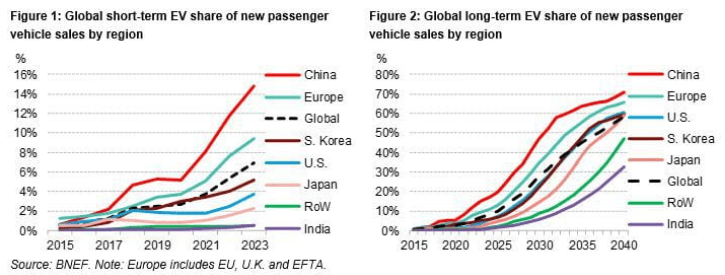

*Source*: [SeekingAlpha](https://seekingalpha.com/article/4410640-ev-company-news-for-month-of-february-2021)

However, one of the most commonly cited barriers is the uncertainty associated with needing access to charging facilities for PEV drivers to plug in their vehicles (range anxiety). EV charging companies, towns and municipalities, individual businesses, local and federal government, are all interested in providing servies and capitalizing on this projected need. But how many and what kind of charging stations are needed? Where and how often do PEV drivers charge? The charging model for EVs is very dissimilar to that for fossil fuel vehicles, with charging time dependent on charger type and battery capacity. Therefore it's not as simple as adding EV charging stations to gas stations. The user's charging behavior will vary depending on where they live, where they work, and their travel patterns. Other than at home or at the workplace (primary and secondary charging locations), charging also occurs at individual charging stations at different parking lots. There are lots of logistical questions to answer, but what is clear is that publicly accessible EV charging infrastructure will need to be expanded. 

**In this project, I will develop a proposal for EV charging station distribution in WA state over time until 2030, based on historical and projected EV sales in WA and the current EV charging station distribution in WA.**


### Goal(s)
Proactively build out EV charging infrastructure in WA state.

### Objective(s)
Develop a proposal for EV charging station geographical distribution in WA state.

## Approach
1. Learn how EV ownership clusters geographically
2. Learn how EV charging stations cluster geographically
3. Relate the patterns of these 2 clusters together somehow
4. Based on estimated sales growth, project increase in ownership
5. Based on projected increase in ownership, estimate charging station geographical distribution over time (number per city?) into the future

### Success Metrics

#### 1. MVP: 
Estimate charging station geographical distribution over time

#### 2. Stretch: 
* Improve granularity of geographical distribution within a specific city
* Incorporate usage patterns for city-based stations
* Incorporate driving patterns for highway-based stations

### Risks
* I have to figure out geographical clustering (though since everything's row & column-based, this should not be any different than what we've done in class)
* I haven't yet managed to extract adjacent geographical-based information for each location of interest
* I think I will have ~100,000 locations overall. May need more computational power for modeling?
* I'm not sure what time-based forecasting methods are like

### Assumptions
* Model year is the same as model sold
    * This is not true as older vehicles come onto the resale market
* Current EV charging station distribution is optimal for the current number of EVs
* Number of charging stations scales with number of EVs

### Initial EDA

As part of the initial EDA, I discovered that:
* The mean base MSRP for an EV is \$33k
* Majority (54%) EV owners are in King County (where Seattle is)
* Most chargers (91%) are level 2 chargers. 21% are free to plug in
* EV range seems to have 2 groups, one centered around 50 miles and the other around 250 miles.
* The geographical distribution (using Folium) of EV ownership and charging station location show dense co-location in cities, and sparse distribution along highways

### Additional thoughts
* I may want to reduce the geographical scope from all of WA to just King County (which has the most number of EVs registered)
    * Or I may want to keep it state-wide to capture city vs highway distribution differences
* Enrich the datasets by extracting and associating the following pieces of information to each location:
    * city population
    * median income
    * roadway types
    * zoning information (residential or business)
    * business types within some X-distance away
    * anything else I can think of
* Somehow incorporate usage information into the model

### Datasets:
1. EVs registered in WA state (.csv file in hand) [*Source*](https://catalog.data.gov/dataset/electric-vehicle-population-data)
2. EV charging stations in WA state (.csv file in hand) [*Source*](https://afdc.energy.gov/fuels/electricity_locations.html#/find/nearest?fuel=ELEC)
3. Median household income estimates for WA by [zip code](https://www.unitedstateszipcodes.org/rankings/zips-in-wa/median_household_income/) (need to scrape this)
4. Charging station behavior (3 datasets in hand, none for WA (yet))

### Additional Resources
* [Geospatial Clustering] (https://towardsdatascience.com/geospatial-clustering-kinds-and-uses-9aef7601f386)
* More [geospatial clustering](https://towardsdatascience.com/data-101s-spatial-visualizations-and-analysis-in-python-with-folium-39730da2adf)

In [1]:
# Plotting latitude and longitude of each registered vehicle / charging station on a map
# https://nbviewer.jupyter.org/github/ThibautBremand/Coursera_Capstone/blob/master/1-Toronto_Clustering_By_Venues_Categories.ipynb

import numpy as np
import pandas as pd
import seaborn as sns
import re

import folium
import requests

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

import matplotlib
matplotlib.style.use('ggplot')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

import geocoder # import geocoder

# 1. EVs registered in WA state

In [2]:
registered = pd.read_csv('./Data/Electric_Vehicle_Population_Data.csv')
registered.head()

,VIN (1-10),County,City,State,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location
0,1N4BZ0CP4G,King,VASHON,WA,98070,2016,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,29010,34.0,150297220,POINT (-122.469161 47.415443)
1,1N4BZ0CP4G,Snohomish,MILL CREEK,WA,98012,2016,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,29010,44.0,157035826,POINT (-122.20151499999999 47.843376)
2,1N4AZ0CP7D,King,SEATTLE,WA,98115,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,28800,46.0,172368493,POINT (-122.297534 47.685291)
3,1N4BZ0CP5G,King,REDMOND,WA,98053,2016,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,29010,45.0,209103016,POINT (-122.024951 47.670286)
4,1N4BZ0CP1H,Pierce,TACOMA,WA,98403,2017,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,107,30680,27.0,193838172,POINT (-122.45971600000001 47.265523)


In [3]:
registered.columns = registered.columns.str.lower()
registered.rename(columns=lambda c: c.replace(' ','_'), inplace=True)

registered.rename(columns={'vin_(1-10)':'vin',
                     'clean_alternative_fuel_vehicle_(cafv)_eligibility':'cafv_elig'},inplace=True)

In [4]:
registered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67925 entries, 0 to 67924
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   vin                    67925 non-null  object 
 1   county                 67925 non-null  object 
 2   city                   67925 non-null  object 
 3   state                  67925 non-null  object 
 4   zip_code               67925 non-null  int64  
 5   model_year             67925 non-null  int64  
 6   make                   67925 non-null  object 
 7   model                  67925 non-null  object 
 8   electric_vehicle_type  67925 non-null  object 
 9   cafv_elig              67925 non-null  object 
 10  electric_range         67925 non-null  int64  
 11  base_msrp              67925 non-null  int64  
 12  legislative_district   67885 non-null  float64
 13  dol_vehicle_id         67925 non-null  int64  
 14  vehicle_location       67923 non-null  object 
dtypes:

In [5]:
registered['vehicle_location'].fillna(0, inplace=True)

In [6]:
registered.describe()

,zip_code,model_year,electric_range,base_msrp,legislative_district,dol_vehicle_id
count,67925.000000,67925.000000,67925.000000,67925.000000,67885.000000,6.792500e+04
mean,98221.036393,2017.218668,140.648789,33019.295326,30.342123,2.072633e+08
std,1486.644114,2.457672,99.325695,22362.279819,14.614884,1.261085e+08
min,320.000000,1993.000000,0.000000,0.000000,1.000000,4.385000e+03
25%,98052.000000,2016.000000,38.000000,28800.000000,20.000000,1.239379e+08
50%,98118.000000,2018.000000,149.000000,33520.000000,35.000000,1.733881e+08
75%,98366.000000,2019.000000,220.000000,37495.000000,43.000000,2.757715e+08
max,99403.000000,2021.000000,337.000000,845000.000000,49.000000,4.792548e+08


There are definitely price outliers.

## Cities with 15 most EV counts

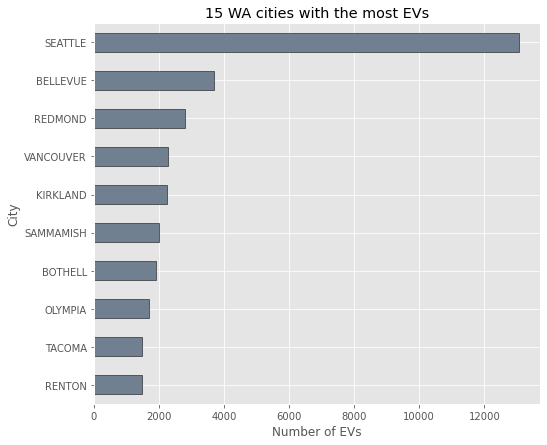

In [7]:
df_city = registered.groupby(by='city')['vin'].count()

plt.figure(figsize=(8,7))
df_city.sort_values(ascending=True)[-10:].plot(kind='barh',color='slategray',edgecolor='black')
plt.xlabel('Number of EVs')
plt.ylabel('City')
plt.title('15 WA cities with the most EVs')
plt.show()

70% of these cities are in King County (where Seattle is).

In [8]:
registered['county'].value_counts(normalize=True).sort_values(ascending=False)[:5]

King         0.536813
Snohomish    0.105160
Pierce       0.072668
Clark        0.054590
Thurston     0.038160
Name: county, dtype: float64

## EV number by year

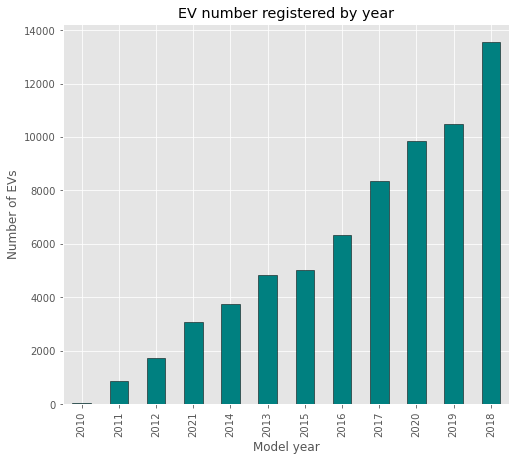

In [9]:
df_year = registered.groupby(by='model_year')['vin'].count()

plt.figure(figsize=(8,7))
df_year.sort_values(ascending=True)[-12:].plot(kind='bar',color='teal',edgecolor='black')
# plt.plot(x=registered['model_year'], y=)
plt.xlabel('Model year')
plt.ylabel('Number of EVs')
plt.title('EV number registered by year')
plt.show()

## Vehicle type

In [10]:
registered['electric_vehicle_type'].value_counts()

Battery Electric Vehicle (BEV)            49021
Plug-in Hybrid Electric Vehicle (PHEV)    18904
Name: electric_vehicle_type, dtype: int64

## Range

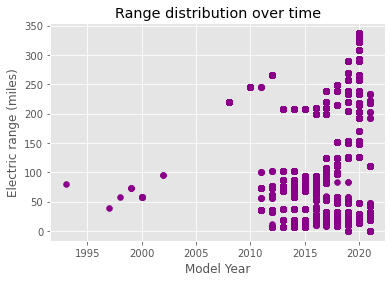

In [11]:
plt.scatter(x=registered['model_year'],y=registered['electric_range'],color='darkmagenta')
plt.xlabel('Model Year')
plt.ylabel('Electric range (miles)')
plt.title('Range distribution over time')
plt.show()

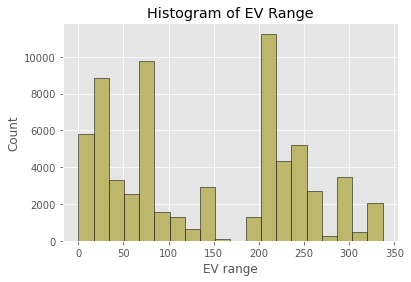

In [12]:
registered['electric_range'].hist(bins=20,color='darkkhaki',edgecolor='black')
plt.xlabel('EV range')
plt.ylabel('Count')
plt.title('Histogram of EV Range')
plt.show()

EV range seems to have 2 groups, one centered around 50 miles and the other around 250 miles.

## MSRP

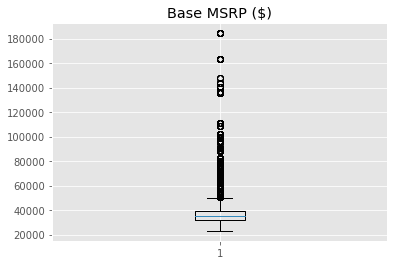

In [13]:
df_msrp = registered[(registered['base_msrp']>0) & (registered['base_msrp']<845000)]

plt.boxplot(df_msrp['base_msrp'])
plt.title('Base MSRP ($)')
plt.show()

That is a huge price distribution.

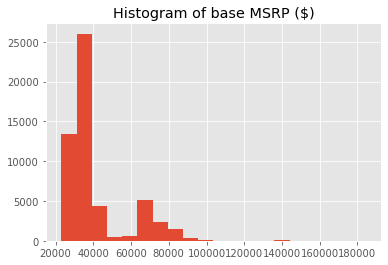

In [14]:
plt.hist(df_msrp['base_msrp'], bins=20)
plt.title('Histogram of base MSRP ($)')
plt.show()

And in fact, the price distribution seems to have 2 clusters, centered around \\$33k, and \\$70k. Does the binary price distribution match the binary range distribution?

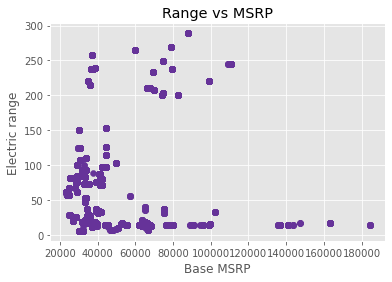

In [15]:
plt.scatter(df_msrp['base_msrp'],df_msrp['electric_range'],color='rebeccapurple')
plt.xlabel('Base MSRP')
plt.ylabel('Electric range')
plt.title('Range vs MSRP')
plt.show()

There are maybe 4 clusters:
1. high range (220 miles)
    * low price (\\$33k)
    * mid price (\\$80k)
2. low range (50 miles)
    * low-mid price(\\$60k)
    * high price (\\$150k) (the power of brands)

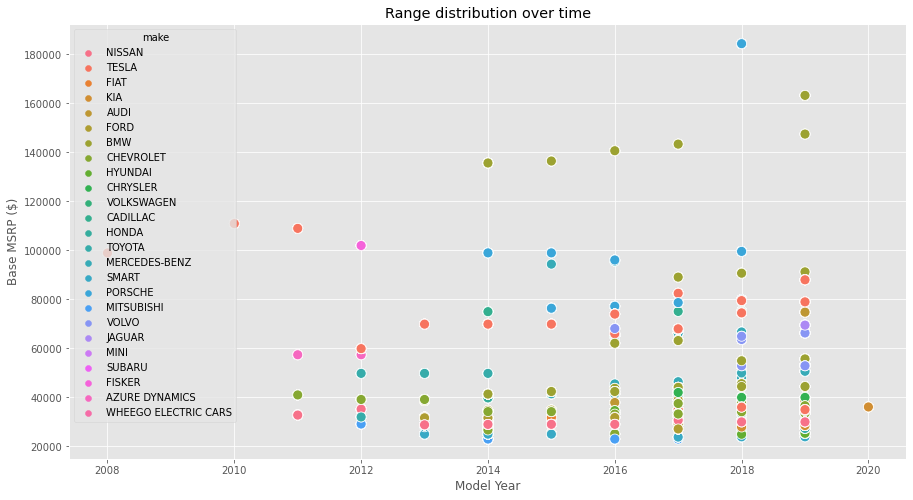

In [16]:
# plt.scatter(x=df_msrp['model_year'],y=df_msrp['base_msrp'],color='darkmagenta')
plt.figure(figsize=[15,8])
sns.scatterplot(data=df_msrp, x="model_year", y="base_msrp", hue="make", s=100)
plt.xlabel('Model Year')
plt.ylabel('Base MSRP (\$)')
plt.title('Range distribution over time')
plt.show()

## Map EV ownership locations

In [17]:
def split_location(row):
    if row == 0:
        longitude = None
        latitude = None
        return latitude, longitude
    else:
        try:
            row_split = re.split(' |\(|\)',row)
            longitude = float(row_split[-3])
            latitude = float(row_split[-2])
            return latitude, longitude
        except:
            pass

In [18]:
location_with_lat_long = []

# loop through each location
for row in registered['vehicle_location']:
    # fill the temp list with latitude and longitude
    latitude, longitude = split_location(row)
    location_with_lat_long.append([latitude, longitude])

In [19]:
# Transform the temp list into a dataframe
df_loc = pd.DataFrame(location_with_lat_long)
df_loc.columns = ['latitude', 'longitude']

In [20]:
df_loc.head(2)

,latitude,longitude
0,47.415443,-122.469161
1,47.843376,-122.201515


In [21]:
registered.head(2)

,vin,county,city,state,zip_code,model_year,make,model,electric_vehicle_type,cafv_elig,electric_range,base_msrp,legislative_district,dol_vehicle_id,vehicle_location
0,1N4BZ0CP4G,King,VASHON,WA,98070,2016,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,29010,34.0,150297220,POINT (-122.469161 47.415443)
1,1N4BZ0CP4G,Snohomish,MILL CREEK,WA,98012,2016,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,29010,44.0,157035826,POINT (-122.20151499999999 47.843376)


In [22]:
# Merge the lat/long dataframe
registered = pd.concat([registered, df_loc], axis=1)
# registered = pd.merge(registered, df_loc, on='vehicle_location')

registered.shape

(67925, 17)

In [23]:
registered.shape, df_loc.shape

((67925, 17), (67925, 2))

## Generate map

Retrieve coordinates so we can draw using Folium.

In [24]:
# initialize to None
lat_lng_coords = None

# loop until we get the coordinates
while(lat_lng_coords is None):
    g = geocoder.arcgis('Ellensburg, Washington') # I want the WA map to be centered on the middle of WA state
    lat_lng_coords = g.latlng

latitude_wa = lat_lng_coords[0]
longitude_wa = lat_lng_coords[1]

print('The geograpical coordinate of Seattle are {}, {}.'.format(latitude_wa, longitude_wa))

The geograpical coordinate of Seattle are 46.99703000000005, -120.54871999999995.


Draw Washington state with EV purchased locations from the dataframe.

In [25]:
map_wa = folium.Map(width=1000, height=700,location=[latitude_wa, longitude_wa], zoom_start=7)

# add markers to map
# just plot 10% of the 67925 locations, as proof of possibility
# hmm... kind of busy. might want to replot this as 1 circle per city, 
# with the size being representative of the number of vehicles
# this is probably a thing that's easier on Tableau

num_loc = round(registered.shape[0]/10)
for lat, lng in zip(registered['latitude'][:num_loc], registered['longitude'][:num_loc]):
#     label = '{}'.format(postalCode)
#     label = folium.Popup(label, parse_html=True)
    try:
        folium.CircleMarker(
            [lat, lng],
            radius=5,
    #         popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7).add_to(map_wa) 
    except:
        print('NaN')
    
map_wa

There is a rendering issue with the map that needs to be resolved. Temporary screenshot here instead.

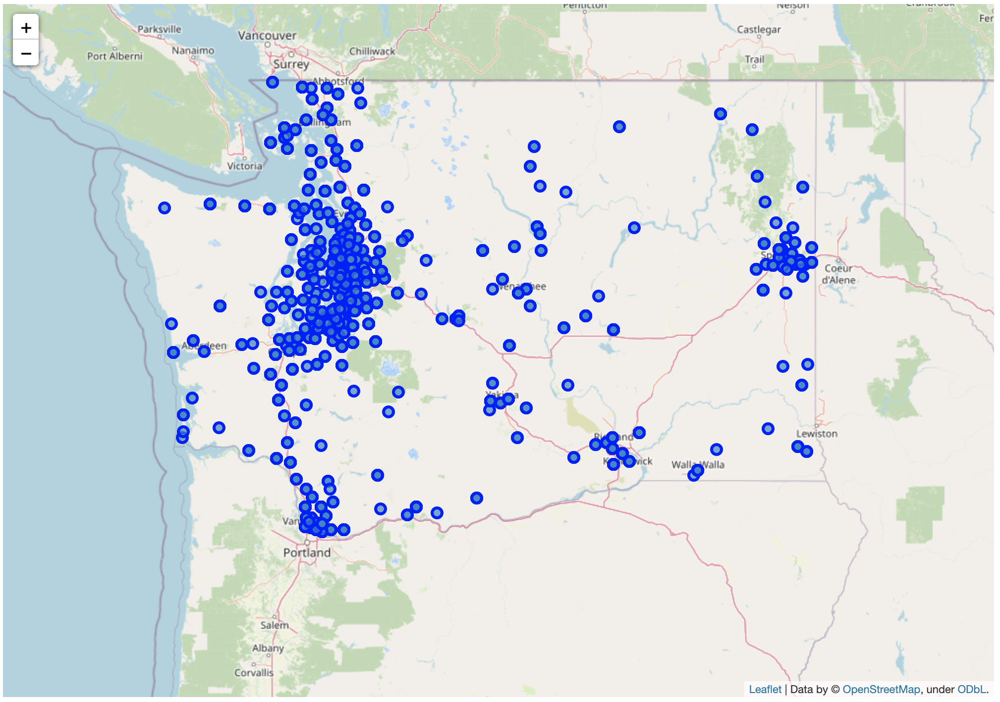

* EV ownership is clustered in cities, which is expected. At the moment, EV ownership is probably still highly correlated with income, and city populations typically have higher median income. 
* Probably those owners in the middle of nowhere charge their vehicles either at home or at work.

# 2. EV Charging Stations in WA State

In [26]:
# need to download the data dictionary for this
stations = pd.read_csv('./Data/alt_fuel_stations (Mar 23 2021).csv')

/Users/aida/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (3,6,10,13,20,29,31,32,45,46,47,54,63) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [27]:
stations = stations[stations['State']=='WA']

In [28]:
stations.columns = stations.columns.str.lower()
stations.rename(columns=lambda c: c.replace(' ','_'), inplace=True)

In [29]:
stations['federal_agency_name'].value_counts()

U.S. Department of Energy               46
Department of Navy                      35
Department of the Interior               4
Department of Transportation             3
U.S. Department of Agriculture           2
U.S. Environmental Protection Agency     2
Department of Homeland Security          1
Department of Army                       1
Department of Commerce                   1
Department of Justice                    1
Name: federal_agency_name, dtype: int64

In [30]:
# select features to grab from stations
features=['station_name', 'street_address',
       'intersection_directions', 'city', 'state', 'zip',
          'groups_with_access_code','access_days_time','ev_level1_evse_num',
       'ev_level2_evse_num', 'ev_dc_fast_count', 'ev_network',
       'ev_network_web', 'geocode_status', 'latitude', 'longitude','date_last_confirmed', 
          'id', 'updated_at', 'owner_type_code','open_date','ev_connector_types','facility_type',
          'ev_pricing', 'ev_on-site_renewable_source']

In [31]:
substations = stations[features]
substations.head(2)

,station_name,street_address,intersection_directions,city,state,zip,groups_with_access_code,access_days_time,ev_level1_evse_num,ev_level2_evse_num,ev_dc_fast_count,ev_network,ev_network_web,geocode_status,latitude,longitude,date_last_confirmed,id,updated_at,owner_type_code,open_date,ev_connector_types,facility_type,ev_pricing,ev_on-site_renewable_source
112,City of Lacey - City Hall Parking,420 College St,"At 3rd Ave SE, next to police station",Lacey,WA,98503,Public,24 hours daily,NaN,4.0,NaN,Non-Networked,NaN,200-9,47.044011,-122.822404,2021-01-14,33351,2021-03-11 23:22:17 UTC,LG,2018-01-15,J1772,MUNI_GOV,NaN,NaN
126,Seattle-Tacoma International Airport - General Parking,17801 Pacific Hwy S,"5th floor parking garage; rows D, G, and I",Seattle,WA,98188,Public,24 hours daily; pay lot,36.0,NaN,NaN,Non-Networked,NaN,200-8,47.443377,-122.296229,2020-07-13,33717,2021-03-11 23:22:17 UTC,P,2010-03-01,NEMA520,AIRPORT,Free,NaN


In [32]:
substations.shape

(1610, 25)

Check a few values.

In [33]:
substations['facility_type'].value_counts()

HOTEL                        92
FED_GOV                      88
CAR_DEALER                   45
MUNI_GOV                     32
SHOPPING_CENTER              29
OFFICE_BLDG                  24
SHOPPING_MALL                20
GROCERY                      19
BREWERY_DISTILLERY_WINERY    14
INN                          11
PARKING_LOT                  11
OTHER_ENTERTAINMENT          10
UTILITY                      10
COLLEGE_CAMPUS               10
HOSPITAL                      9
RESTAURANT                    6
NATL_PARK                     6
PARKING_GARAGE                5
PARK                          5
MIL_BASE                      4
STATE_GOV                     4
MULTI_UNIT_DWELLING           4
AIRPORT                       4
PAY_GARAGE                    3
GAS_STATION                   3
BANK                          3
FLEET_GARAGE                  2
CONVENIENCE_STORE             2
STREET_PARKING                2
B_AND_B                       2
REC_SPORTS_FACILITY           2
LIBRARY 

In [34]:
substations['ev_pricing'].value_counts()

Free                                                                                                         267
Level 2: $0.49 per kWh                                                                                       115
FREE                                                                                                          70
$2.00/Hr Parking Fee                                                                                          32
$0.28 per kWh; $0.26 per minute above 60 kW and $0.13 per minute at or below 60 kW                            25
$1 per session                                                                                                18
$1.50/Hr Parking Fee                                                                                           9
$0.00-$5.00/Hr Variable Parking Fee                                                                            8
DC Fast: $7.50 per session or $19.99 for monthly plan, Level 2: $4 per session or $19.99 for mon

In [35]:
substations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1610 entries, 112 to 44772
Data columns (total 25 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   station_name                 1610 non-null   object 
 1   street_address               1610 non-null   object 
 2   intersection_directions      123 non-null    object 
 3   city                         1610 non-null   object 
 4   state                        1610 non-null   object 
 5   zip                          1610 non-null   object 
 6   groups_with_access_code      1610 non-null   object 
 7   access_days_time             1490 non-null   object 
 8   ev_level1_evse_num           60 non-null     float64
 9   ev_level2_evse_num           1470 non-null   float64
 10  ev_dc_fast_count             187 non-null    float64
 11  ev_network                   1610 non-null   object 
 12  ev_network_web               1304 non-null   object 
 13  geocode_status 

Most chargers (91%) are level 2 chargers. 21% are free to plug in.

In [36]:
map_stations = folium.Map(width=1000, height=700,location=[latitude_wa, longitude_wa], zoom_start=7)

# add markers to map

for lat, lng in zip(substations['latitude'], substations['longitude']):
#     label = '{}'.format(postalCode)
#     label = folium.Popup(label, parse_html=True)
    try:
        folium.CircleMarker(
            [lat, lng],
            radius=5,
    #         popup=label,
            color='red',
            fill=True,
            fill_color='#e3942d',
            fill_opacity=0.7).add_to(map_stations) 
    except:
        print('NaN')
    
map_stations

There is a rendering issue with the map that needs to be resolved. Temporary screenshot here instead.

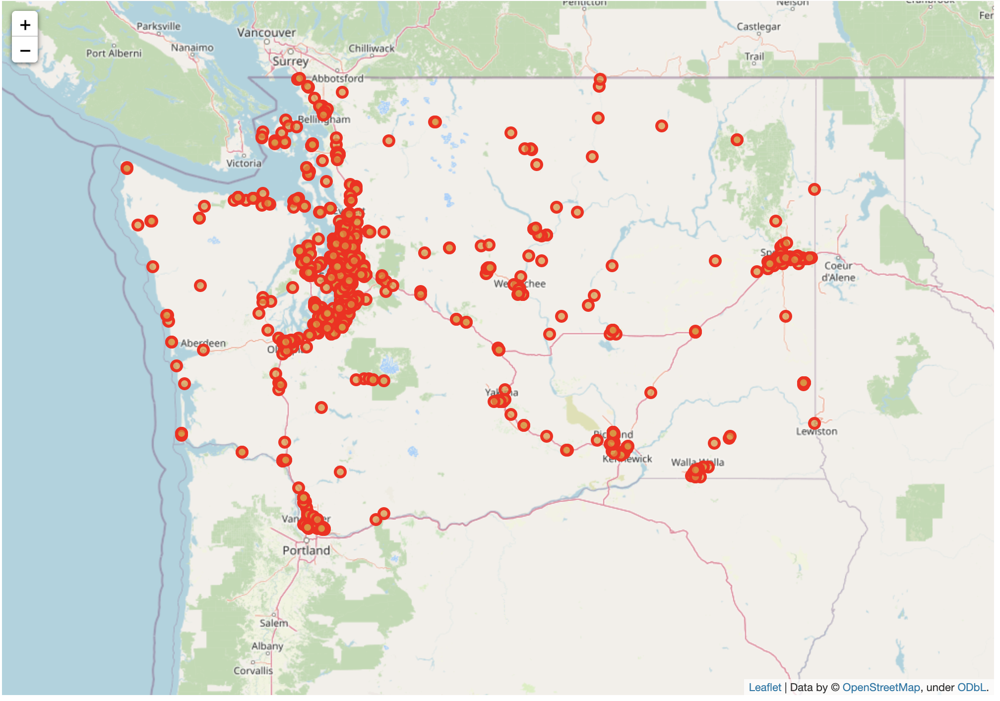

There are 2 visually observable distributions: stations that cluster around cities, and stations that are distributed along major highways.

## Look at overlap between ownership location and charging station location

In [37]:
# add station markers to ownership map

for lat, lng in zip(substations['latitude'], substations['longitude']):
#     label = '{}'.format(postalCode)
#     label = folium.Popup(label, parse_html=True)
    try:
        folium.CircleMarker(
            [lat, lng],
            radius=5,
    #         popup=label,
            color='red',
            fill=True,
            fill_color='#e3942d',
            fill_opacity=0.7).add_to(map_wa) 
    except:
        print('NaN')
    
map_wa

There is a rendering issue with the map that needs to be resolved. Temporary screenshot here instead.

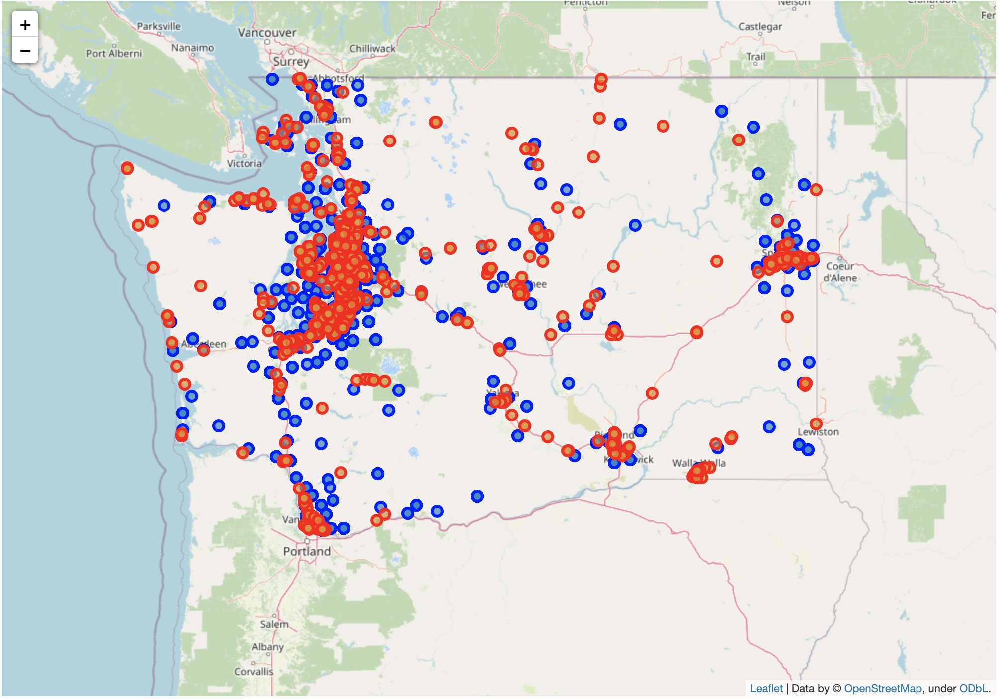

**THAT IS SO COOL!!** I will want to extract some kind of geographical distribution pattern from this.

## Get nearest roads from OpenStreetMaps

This does not work properly (yet).

In [38]:
from overpass import API
from time import sleep
from sys import exc_info

In [39]:
# https://leshaved.wordpress.com/2015/12/01/getting-nearest-roads-from-osm-in-python/
# download all roads which are closer than 50 meters to each of the points

api = API()
  
locations=[(50.406029,30.619727),(27.988056, 86.925278)]
for loc in locations:
    xx,yy=loc[0],loc[1]
    try:
        response = api.Get('way["highway"](around:50,{0},{1});'.format(loc[0],loc[1])) 
        print(f"For location with coordinates {0}, {1} found way IDs:".format(loc[0],loc[1]))
        if len(response['elements'])>0:
            for way in response['elements']:
                print(way['id'])
        else:
            print(f"No ways")
        sleep(1)
    except:
        print(f"Got error: {0}".format(exc_info())[0])

For location with coordinates 0, 1 found way IDs:
G
For location with coordinates 0, 1 found way IDs:
G


In [40]:
# python anaconda r jupyter pandas koalas theano caffe beautiful soup seaborn

# A python, anaconda, pandas, and koalas R having caffe. On Jupyter. With Theano. And thus, a beautiful soup i(sea)born.